# IVUS Challenge

In [1]:
from scipy import interpolate
import matplotlib.pyplot as plt
from matplotlib.path import Path
import numpy as np
import cv2
import random
import os
import keras
import pandas as pd
import matplotlib.patches as mpatches
import matplotlib.pyplot as plt
import tensorflow as tf

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras import models
from tensorflow.keras import backend as K

from sklearn.model_selection import train_test_split

from keras.preprocessing.image import ImageDataGenerator

from sklearn.metrics import jaccard_score, classification_report, confusion_matrix
from skimage.metrics import hausdorff_distance
from skimage.measure import block_reduce
from Challenge_measures.confusion_matrix_pretty_print import plot_confusion_matrix_from_data


version = 2
seed = 123

2021-11-19 12:11:47.005277: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0


In [2]:
from tensorflow.python.client import device_lib
print(device_lib.list_local_devices())

[name: "/device:CPU:0"
device_type: "CPU"
memory_limit: 268435456
locality {
}
incarnation: 17948246554684966244
, name: "/device:GPU:0"
device_type: "GPU"
memory_limit: 5020909568
locality {
  bus_id: 1
  links {
  }
}
incarnation: 18311748222327746581
physical_device_desc: "device: 0, name: NVIDIA GeForce GTX 1060 with Max-Q Design, pci bus id: 0000:01:00.0, compute capability: 6.1"
]


2021-11-19 12:11:48.745472: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2021-11-19 12:11:48.751419: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcuda.so.1
2021-11-19 12:11:48.802410: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-11-19 12:11:48.802598: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1733] Found device 0 with properties: 
pciBusID: 0000:01:00.0 name: NVIDIA GeForce GTX 1060 with Max-Q Design computeCapability: 6.1
coreClock: 1.48GHz coreCount: 10 deviceMemorySize: 5.94GiB deviceMemoryBandwidth: 178

## Prepare the data

### Read the images
The images are stored in the <i>Training_Set</i> folder. We will load the images from <i>Data_set_A</i>:

An empirical number of five temporally adjacent frames around the frame $F$ (two before and two after) have been included. It has been considered when more than two frames forward (and backward) in time are considered, consecutive IVUS frames might not be aligned. 

-  A training set: A subset (one fourth) of images from each dataset containing both images and manual annotations. The training set is meant for training and tuning of the algorithms prior to the evaluation. This dataset is distributed upon request for algorithm evaluation.
- A test set: The remaining frames compose the set of images that are used for performance evaluation. The annotations are not available before the algorithm evaluation in order to assure the complete blindness and equity of the algorithm assessment.

Annotations on the image datasets have been provided by four clinical experts, daily working with the specific IVUS echograph brand, and belonging to distinct medical centers. The annotation consists in the delineation of both inner wall (lumen contours) and outer wall (media/adventitia contours) on the IVUS images in the short-axis view. In all the cases, the experts were blinded to the other physicians’ annotations, and two of them repeated the manual annotations after about one week from the first labeling.


In [3]:
# Helper functions
def read_labels(directory, verbose=1):
    """
    Reads the labels from a given directory
    
    returns:
        A dictionary containing:
            'lum': array of labels of 2D coordinates
            'med': array of labels of 2D coordinates
    """
    labels_lum = []
    labels_med = []

    for file_name in sorted(os.listdir(directory)):
        points = []
        with open(os.path.join(directory, file_name)) as f:
            for line in f:
                c0, c1 = line.split(',')
                points.append((float(c0), float(c1)))

        if file_name.startswith("lum"):
            labels_lum.append(points)
        elif file_name.startswith("med"):
            labels_med.append(points)

    labels = {
        'lum': np.array(labels_lum, dtype=object),
        'med': np.array(labels_med, dtype=object)
    }

    if verbose:
        print(f"Annotation for the inner wall (lumen contours): {labels['lum'].shape[0]}")
        print(f"Annotation for the outer wall (media/adventitia contours): {labels['med'].shape[0]}")
        
    return labels

def read_training_dataset(letter="A", verbose=1):
    """
    Reads the training dataset A or B
    
    returns:
        Two tuples (x_train, y_train_label), (x_test, y_test_label):
            x_train: dataset of images for training
            y_train_label: a dictionary containing:
                'lum': array of labels of 2D coordinates
                'med': array of labels of 2D coordinates
            x_test: dataset of images for testing
            y_test_label: a list of 3 dictionaries containing:
                'lum': array of labels of 2D coordinates
                'med': array of labels of 2D coordinates
    """
    path = os.path.join(os.getcwd(), "Training_Set", "Data_set_"+letter, "DCM")

    dataset = []
    subset = []

    count = 0
    for file_name in sorted(os.listdir(path)):
        count += 1
        subset.append(cv2.imread(os.path.join(path, file_name), cv2.IMREAD_GRAYSCALE))

        if count >= 5:
            dataset.append(subset)
            subset = []
            count = 0

    dataset = np.array(dataset)
    
    if verbose:
        print(f"Dataset {letter} has shape: {dataset.shape}")
    
    # Read the labels
    directory = os.path.join(os.getcwd(), "Training_Set", "Data_set_"+letter, "LABELS")
    labels = read_labels(directory, verbose)
    
    
    x_train = dataset[:labels['lum'].shape[0], :, :, :]
    y_train_label = labels
    
    x_test = dataset[labels['lum'].shape[0]:, :, :, :]
    
    # Read test labels
    y_test_label = []
    for dir_name in ['LABELS_obs1', 'LABELS_obs2_v1', 'LABELS_obs2_v2']:
        directory = os.path.join(os.getcwd(), "Test_Set", "Data_set_"+letter, dir_name)
        y_test_label.append(read_labels(directory))
    
    return (x_train, y_train_label), (x_test, y_test_label)

In [4]:
(x_train, y_train_label), (x_test, y_test_label) = read_training_dataset("B")

Dataset B has shape: (435, 5, 384, 384)
Annotation for the inner wall (lumen contours): 109
Annotation for the outer wall (media/adventitia contours): 109
Annotation for the inner wall (lumen contours): 326
Annotation for the outer wall (media/adventitia contours): 326
Annotation for the inner wall (lumen contours): 326
Annotation for the outer wall (media/adventitia contours): 326
Annotation for the inner wall (lumen contours): 326
Annotation for the outer wall (media/adventitia contours): 326


#### Downsample images for better training
Now we will downsample our training and test dataset in order to be more memory-efficient when training. We must note that when we downsample by a half our images (from 384x384 to 192x192 in dataset B), then we need to divide by 2 our contour coordinates as well.

In [5]:
def downsample_image(image):
    """Downsample image by half by applying mean pooling"""
    return block_reduce(image, block_size=(2,2), func=np.mean)

In [6]:
x_train_ds = []
for batch in x_train:
    x_train_ds.append([downsample_image(image) for image in batch])

x_train_ds = np.array(x_train_ds)
y_train_label_ds = {
    'lum': y_train_label['lum']/2.,
    'med': y_train_label['med']/2.
}

x_test_ds = []
for batch in x_test:
    x_test_ds.append([downsample_image(image) for image in batch])

x_test_ds = np.array(x_test_ds)
y_test_label_ds = {'lum': y_test_label[0]['lum']/2., 'med': y_test_label[0]['med']/2.}

print(f"Training set now has shape {x_train_ds.shape}")
print(f"Test set now has shape {x_test_ds.shape}")

Training set now has shape (109, 5, 192, 192)
Test set now has shape (326, 5, 192, 192)


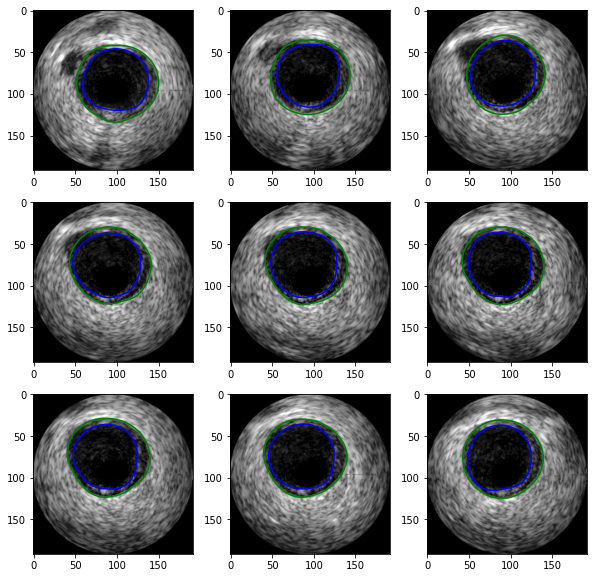

In [7]:
# Display some images
plt.figure(figsize=(10, 10))

for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.plot(y_train_label_ds['lum'][i][:, 0], y_train_label_ds['lum'][i][:, 1], 'b-')
    plt.plot(y_train_label_ds['med'][i][:, 0], y_train_label_ds['med'][i][:, 1], 'g-')
    plt.imshow(x_train_ds[i][2], cmap='gray')

### Create a set of mask images
We will use the labels we have to mask the interior of the paths they draw. Since we have three different classes: background, media and lumen; we will create a multiclass segmentation.

In [8]:
num_classes = 3
CLASSES = ['background', 'media', 'lumen']

In [9]:
def create_masks(x, y):
    """
    Create masks from a dataset and its labels
    
    parameters:
        x: dataset of images
        y: array of labels of 2D coordinates
    returns:
        An array containing multiclass images segmented as follows:
            - Value 0 represents background
            - Value 1 represents the media
            - Value 2 represents the lumen
    """
    
    masks = []

    for i in range(y['lum'].shape[0]):
        # Retrieve path from the label
        path_lum = Path(y['lum'][i])
        path_med = Path(y['med'][i])
        img = x[i][2]

        # Create a matrix of coordinates to check which points are inside the closed path
        img_meshgrid = np.array(np.meshgrid(*(np.arange(s) for s in img.shape[:2]), indexing='xy'))
        img_coordinates = img_meshgrid.transpose([1,2,0]).reshape(img.shape[0]*img.shape[1],2)
        mask_lum = path_lum.contains_points(img_coordinates).reshape(img.shape[0],img.shape[1])
        mask_med = path_med.contains_points(img_coordinates).reshape(img.shape[0],img.shape[1])

        final_mask = mask_lum.astype(int) + mask_med.astype(int)
        
        masks.append(final_mask)
        
    return np.array(masks)

def get_one_hot(targets, nb_classes):
    """Returns the targets as one-hot encoded"""
    res = np.eye(nb_classes)[np.array(targets).reshape(-1)]
    return res.reshape(list(targets.shape)+[nb_classes])

### One-hot encoding
We one-hot encode our labels in the following way:
- Background pixels: [1, 0, 0]
- Media pixels: [0, 1, 0]
- Lumen pixels: [0, 0, 1]

This encoding will help optimize our model because we plan to output the probability of each pixel belonging to a certain class.

In [10]:
y_train_ds = get_one_hot(create_masks(x_train_ds, y_train_label_ds), num_classes)

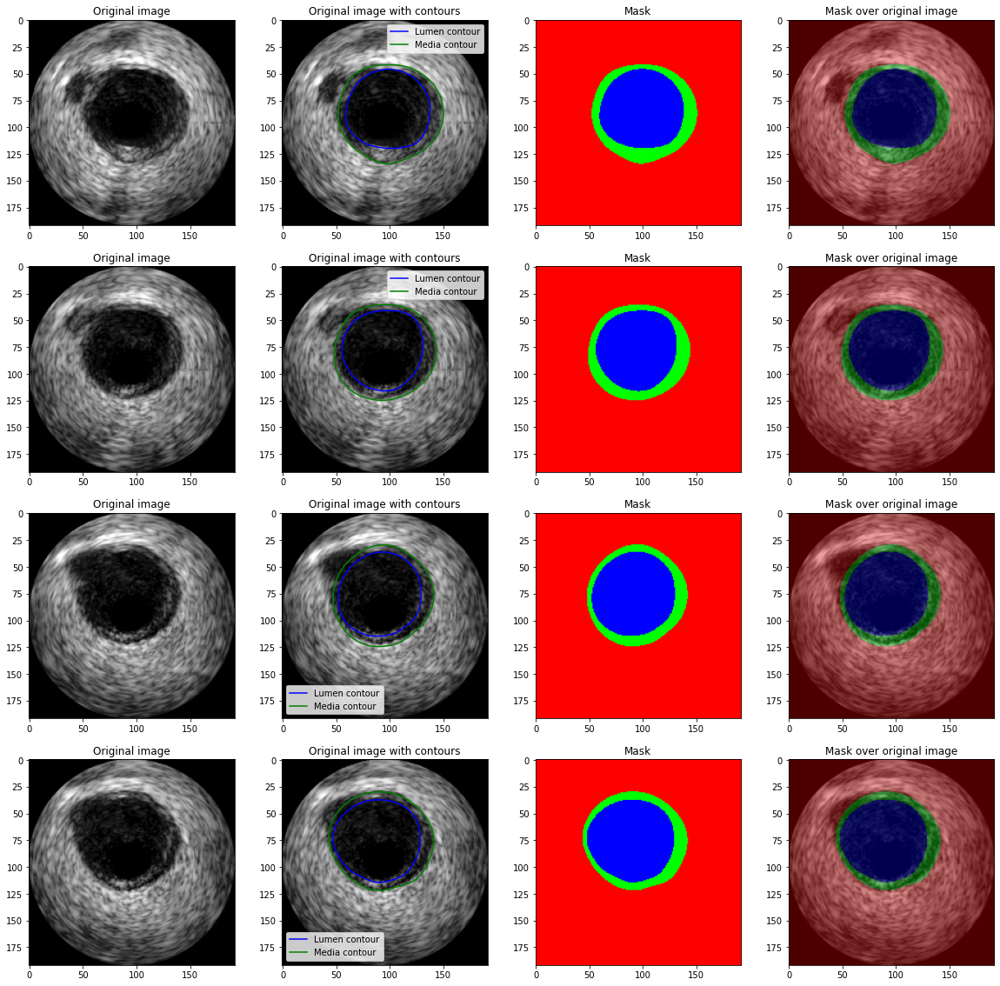

In [29]:
# Let's show some examples
plt.figure(figsize=(20, 20))

samples = 4

for i in range(samples):
    
    
    ax = plt.subplot(samples, 4, 4*i + 1)
    plt.imshow(x_train_ds[i][2], cmap='gray')
    plt.title('Original image')
    
    ax = plt.subplot(samples, 4, 4*i + 2)
    plt.plot(y_train_label_ds['lum'][i][:, 0], y_train_label_ds['lum'][i][:, 1], 'b-', label='Lumen contour')
    plt.plot(y_train_label_ds['med'][i][:, 0], y_train_label_ds['med'][i][:, 1], 'g-', label='Media contour')
    plt.imshow(x_train_ds[i][2], cmap='gray')
    plt.title('Original image with contours')
    plt.legend()
    
    
    mask = y_train_ds[i]/y_train_ds.max()
    ax = plt.subplot(samples, 4, 4*i + 3)
    plt.imshow(mask)
    plt.title('Mask')
    
    
    image = np.repeat(x_train_ds[i][2][..., np.newaxis], 3, axis=2)
    alpha = 0.7
    ax = plt.subplot(samples, 4, 4*i + 4)
    plt.imshow(np.uint8(image*alpha + mask*255*(1-alpha)))
    plt.title('Mask over original image')

### Data augmentation
We have 19 images to train using dataset A and 109 images in dataset B. Therefore we should apply Data Augmentation in order to get more training examples to feed into our model.

In this test we will only use the images adjacent to the middle image and we will pass these 3 images as 3 channels RGB to the data generator.

In [12]:
images = x_train_ds[:, 2:5, :, :].transpose([0, 2, 3, 1])/255 # Now the shape is (109, 192, 192, 3) (for dataset B)
masks = np.copy(y_train_ds) # Now the shape is (109, 192, 192, channels) (for dataset B)

print(f"Shape of set images: {images.shape}")
print(f"Shape of set masks: {masks.shape}")


input_shape = images.shape[1:] # (192, 192, 3)

Shape of set images: (109, 192, 192, 3)
Shape of set masks: (109, 192, 192, 3)


In [13]:
batch_size = 20

# we create two instances with the same arguments
data_gen_args = dict(data_format="channels_last", # Image shape is (samples, height, width, channels)
                     fill_mode='nearest',
                     rotation_range=90,
                     width_shift_range=0.2,
                     height_shift_range=0.2,
                     zoom_range=0.2,
                     validation_split=0.15)
val_data_gen_args = dict(data_format="channels_last", validation_split=0.15)

image_datagen = ImageDataGenerator(**data_gen_args)
mask_datagen = ImageDataGenerator(**data_gen_args)

val_datagen = ImageDataGenerator(**val_data_gen_args)

image_datagen.fit(images, augment=True, seed=seed)
mask_datagen.fit(masks, augment=True, seed=seed)

# Provide the same seed and keyword arguments to the fit and flow methods
image_generator = image_datagen.flow(images, seed=seed, batch_size=batch_size, subset='training')
mask_generator = mask_datagen.flow(masks, seed=seed, batch_size=batch_size, subset='training')

image_val_generator = val_datagen.flow(images, seed=seed, batch_size=batch_size, subset='validation')
mask_val_generator = val_datagen.flow(masks, seed=seed, batch_size=batch_size, subset='validation')

# combine generators into one which yields image and masks
train_generator = zip(image_generator, mask_generator)
val_generator = zip(image_val_generator, mask_val_generator)

def gen_dtype(gen):
    for i,j in gen:
        yield (i.astype('float32'), j.astype('float32'))

#def gen_dtype_test(gen):
#    for i,j in gen:
#        yield (i.astype('float32'), to_categorical(j.astype('int'), num_classes=num_classes))

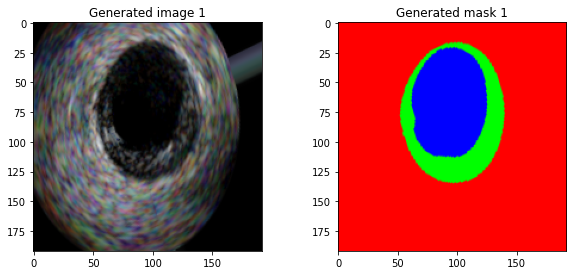

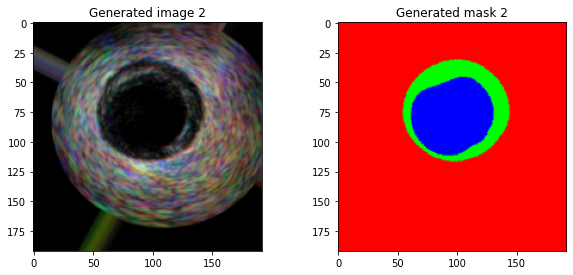

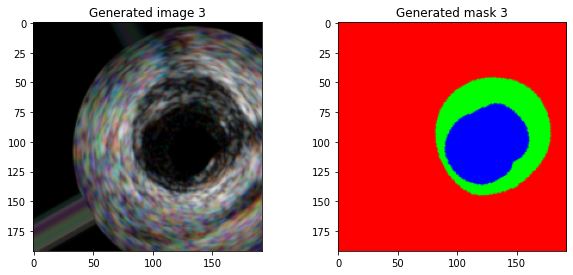

In [14]:
# Let's show some example
images_gen, masks_gen = next(gen_dtype(train_generator))
samples = len(images_gen)

for i in range(3):
    plt.figure(figsize=(10,100))
    plt.subplot(samples, 2, 2*i+1)
    plt.imshow(images_gen[i], cmap='gray')
    plt.title(f"Generated image {i+1}")
    
    plt.subplot(samples, 2, 2*i+2)
    plt.imshow(masks_gen[i])
    plt.title(f"Generated mask {i+1}")

## Transfer Learning with U-Net

### Transfer learning
We will leverage the knowledge in a model that's already good at segmentation. This deep learning technique enables developers to harness a neural network used for one task and apply it to another domain. Transfer Learning differs from traditional Machine Learning or Deep Learning in that it is the use of pre-trained models that have been used for another task to jump start the development process on a new task or problem.

### What is a pre-trained model?
A pre-trained model is a model that was trained on a large benchmark dataset to solve a problem similar to the one that we want to solve. Accordingly, due to the computational cost of training such models, it is common practice to import and use models from published literature (e.g. VGG, Inception, MobileNet).
By using pre-trained models which have been previously trained on large datasets, we can directly use the weights and architecture obtained and apply the learning on our problem statement. This is known as transfer learning. We **transfer the learning** of the pre-trained model to our specific problem statement.

### The typical transfer-learning workflow

1. Instantiate a base model and load pre-trained weights into it.
2. Freeze all layers in the base model by setting trainable = False.
3. Create a new model on top of the output of one (or several) layers from the base model.
4. Train your new model on your new dataset.

Note that an alternative, more lightweight workflow could also be:

1. Instantiate a base model and load pre-trained weights into it.
2. Run your new dataset through it and record the output of one (or several) layers from the base model. This is called **feature extraction**.
3. Use that output as input data for a new, smaller model.

A key advantage of that second workflow is that you only run the base model once on your data, rather than once per epoch of training. So it's a lot faster & cheaper.

An issue with that second workflow, though, is that it doesn't allow you to dynamically modify the input data of your new model during training, which is required when doing data augmentation, for instance. Transfer learning is typically used for tasks when your new dataset has too little data to train a full-scale model from scratch, and in such scenarios data augmentation is very important. So in what follows, we will focus on the first workflow.

### V-Unet model
V-Unet (U-Net with VGG16 as the encoder) has a structure shown in the following figure. VGG16, pretrained model on ImageNet is used to replace the contracting path of U-Net as a hybrid between these structures. The whole network had 28,804,545 parameters in total.

source: https://github.com/dorltcheng/Transfer-Learning-U-Net-Deep-Learning-for-Lung-Ultrasound-Segmentation

![V-Unet model](https://raw.githubusercontent.com/dorltcheng/Transfer-Learning-U-Net-Deep-Learning-for-Lung-Ultrasound-Segmentation/main/V_Unet_struct.png)

In [15]:
from Semantic_Segmentation_Architecture.TensorFlow.vgg16_unet import build_vgg16_unet
vunet_model = build_vgg16_unet(input_shape)
vunet_model.summary()

2021-11-18 11:13:38.613820: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-11-18 11:13:38.613976: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1733] Found device 0 with properties: 
pciBusID: 0000:01:00.0 name: NVIDIA GeForce GTX 1060 with Max-Q Design computeCapability: 6.1
coreClock: 1.48GHz coreCount: 10 deviceMemorySize: 5.94GiB deviceMemoryBandwidth: 178.99GiB/s
2021-11-18 11:13:38.614074: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-11-18 11:13:38.614245: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-11-18 11:13:38.614336: I tens

Model: "VGG16_U-Net"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 192, 192, 3) 0                                            
__________________________________________________________________________________________________
block1_conv1 (Conv2D)           (None, 192, 192, 64) 1792        input_1[0][0]                    
__________________________________________________________________________________________________
block1_conv2 (Conv2D)           (None, 192, 192, 64) 36928       block1_conv1[0][0]               
__________________________________________________________________________________________________
block1_pool (MaxPooling2D)      (None, 96, 96, 64)   0           block1_conv2[0][0]               
________________________________________________________________________________________

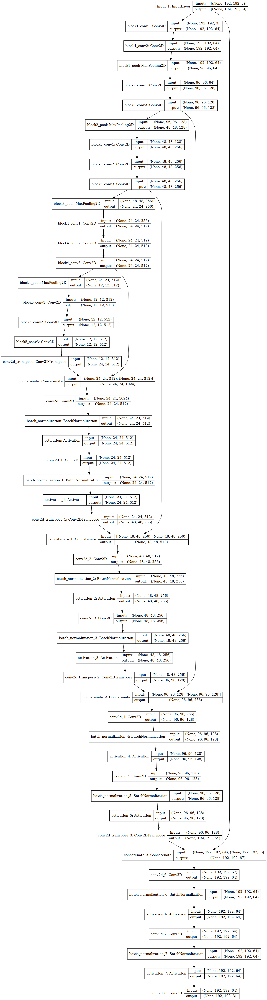

In [16]:
from keras.utils.vis_utils import plot_model
plot_model(vunet_model,to_file='vnet_struct.png',show_shapes=True, show_layer_names=True)

Display layers status (trainable or non-trainable)

In [17]:
vunet_layers = [(layer, layer.name, layer.trainable) for layer in vunet_model.layers]
vunet_model_df = pd.DataFrame(vunet_layers, columns=["Layer Type", "Layer Name", "Layer Trainable"])

display(vunet_model_df)

,Layer Type,Layer Name,Layer Trainable
0,<tensorflow.python.keras.engine.input_layer.In...,input_1,False
1,<tensorflow.python.keras.layers.convolutional....,block1_conv1,False
2,<tensorflow.python.keras.layers.convolutional....,block1_conv2,False
3,<tensorflow.python.keras.layers.pooling.MaxPoo...,block1_pool,False
4,<tensorflow.python.keras.layers.convolutional....,block2_conv1,False
5,<tensorflow.python.keras.layers.convolutional....,block2_conv2,False
6,<tensorflow.python.keras.layers.pooling.MaxPoo...,block2_pool,False
7,<tensorflow.python.keras.layers.convolutional....,block3_conv1,False
8,<tensorflow.python.keras.layers.convolutional....,block3_conv2,False
9,<tensorflow.python.keras.layers.convolutional....,block3_conv3,False


### ResNet50

In [18]:
from Semantic_Segmentation_Architecture.TensorFlow.resnet50_unet import build_resnet50_unet
resnet_model = build_resnet50_unet(input_shape)
resnet_model.summary()

Model: "ResNet50_U-Net"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 192, 192, 3) 0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 198, 198, 3)  0           input_2[0][0]                    
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, 96, 96, 64)   9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
conv1_bn (BatchNormalization)   (None, 96, 96, 64)   256         conv1_conv[0][0]                 
_____________________________________________________________________________________

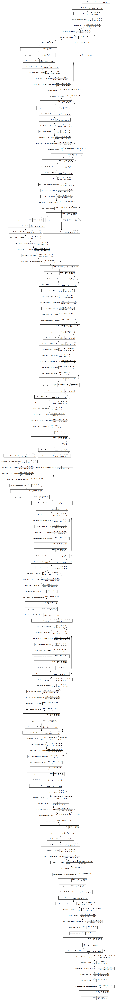

In [19]:
from keras.utils.vis_utils import plot_model
plot_model(resnet_model,to_file='resnet_struct.png',show_shapes=True, show_layer_names=True)

In [20]:
resnet_layers = [(layer, layer.name, layer.trainable) for layer in resnet_model.layers]
resnet_model_df = pd.DataFrame(resnet_layers, columns=["Layer Type", "Layer Name", "Layer Trainable"])

display(resnet_model_df)

,Layer Type,Layer Name,Layer Trainable
0,<tensorflow.python.keras.engine.input_layer.In...,input_2,False
1,<tensorflow.python.keras.layers.convolutional....,conv1_pad,False
2,<tensorflow.python.keras.layers.convolutional....,conv1_conv,False
3,<tensorflow.python.keras.layers.normalization_...,conv1_bn,False
4,<tensorflow.python.keras.layers.core.Activatio...,conv1_relu,False
...,...,...,...
171,<tensorflow.python.keras.layers.core.Activatio...,activation_14,True
172,<tensorflow.python.keras.layers.convolutional....,conv2d_16,True
173,<tensorflow.python.keras.layers.normalization_...,batch_normalization_15,True
174,<tensorflow.python.keras.layers.core.Activatio...,activation_15,True


### DeepLabV3

In [21]:
from Semantic_Segmentation_Architecture.TensorFlow.deeplabv3plus import build_deeplabv3plus
deeplabv3_model = build_deeplabv3plus(input_shape)
deeplabv3_model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 192, 192, 3) 0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 198, 198, 3)  0           input_3[0][0]                    
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, 96, 96, 64)   9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
conv1_bn (BatchNormalization)   (None, 96, 96, 64)   256         conv1_conv[0][0]                 
______________________________________________________________________________________________

In [22]:
from keras.utils.vis_utils import plot_model
plot_model(deeplabv3_model,to_file='deeplab_struct.png',show_shapes=True, show_layer_names=True)

In [23]:
deeplabv3_layers = [(layer, layer.name, layer.trainable) for layer in deeplabv3_model.layers]
deeplabv3_model_df = pd.DataFrame(deeplabv3_layers, columns=["Layer Type", "Layer Name", "Layer Trainable"])

display(deeplabv3_model_df)

,Layer Type,Layer Name,Layer Trainable
0,<tensorflow.python.keras.engine.input_layer.In...,input_3,False
1,<tensorflow.python.keras.layers.convolutional....,conv1_pad,False
2,<tensorflow.python.keras.layers.convolutional....,conv1_conv,False
3,<tensorflow.python.keras.layers.normalization_...,conv1_bn,False
4,<tensorflow.python.keras.layers.core.Activatio...,conv1_relu,False
...,...,...,...
173,<tensorflow.python.keras.layers.normalization_...,batch_normalization_23,True
174,<tensorflow.python.keras.layers.core.Activatio...,activation_23,True
175,<tensorflow.python.keras.layers.convolutional....,up_sampling2d_2,True
176,<tensorflow.python.keras.layers.convolutional....,output_layer,True


## Training the transfer learning U-Net model

Define the loss and metrics functions

In [24]:
#calculates dice considering an input with a single class
def dice_single(true, pred, smooth=1.):
    true = K.batch_flatten(true)
    pred = K.batch_flatten(pred)
    pred = K.round(pred)

    intersection = K.sum(true * pred, axis=-1)
    true = K.sum(true, axis=-1)
    pred = K.sum(pred, axis=-1)

    return ((2*intersection) + smooth) / (true + pred + smooth)

def dice_for_class(index, smooth=1.):
    def dice_inner(true, pred):

        #get only the desired class
        true = true[:,:,:,index]
        pred = pred[:,:,:,index]

        #return dice per class
        return dice_single(true, pred, smooth)
    dice_inner.__name__ = f'dice_{CLASSES[index]}'
    return dice_inner

def dice_coef_loss(y_true, y_pred, smooth=1.):
    """
    Dice loss to minimize: 1 - Dice
    Dice = (2*|X & Y|)/ (|X| + |Y|)
         =  2*sum(|A*B|)/(sum(A^2)+sum(B^2))
    ref: https://arxiv.org/pdf/1606.04797v1.pdf
    """
    # Ignore label 0 which belongs to background
    y_true = K.flatten(y_true)
    y_pred = K.flatten(y_pred)
    intersection = K.sum(y_true * y_pred, axis=-1)
    denom = K.sum(y_true + y_pred, axis=-1)
    dice = K.mean(((2. * intersection + smooth) / (denom + smooth)))
    return 1 - dice

    
def jaccard_coef_loss(y_true, y_pred, smooth=1.):
    """Jaccard distance for semantic segmentation.
    Also known as the intersection-over-union loss.
    
    source code: 
    https://github.com/keras-team/keras-contrib/blob/master/keras_contrib/losses/jaccard.py
    
    Parameters
    -----------
    y_true : Tensor
        A distribution with shape: [batch_size, ....], (any dimensions).
    y_pred : Tensor
        The target distribution, format the same with `output`.
    smooth : float
        This small value will be added to the numerator and denominator.
            - If both output and target are empty, it makes sure dice is 1.
            - If either output or target are empty (all pixels are background),
            dice = ```smooth/(small_value + smooth)``,
            then if smooth is very small, dice close to 0 (even the image values lower than the threshold),
            so in this case, higher smooth can have a higher dice.
            
    """
    intersection = K.sum(K.abs(y_true * y_pred), axis=-1)
    sum_ = K.sum(K.abs(y_true) + K.abs(y_pred), axis=-1)
    jac = (intersection + smooth) / (sum_ - intersection + smooth)
    return (1 - jac) * smooth

2021-11-18 11:13:47.184689: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:176] None of the MLIR Optimization Passes are enabled (registered 2)
2021-11-18 11:13:47.202822: I tensorflow/core/platform/profile_utils/cpu_utils.cc:114] CPU Frequency: 2299965000 Hz


Epoch 1/60


2021-11-18 11:13:48.923666: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudnn.so.8
2021-11-18 11:13:49.356124: I tensorflow/stream_executor/cuda/cuda_dnn.cc:359] Loaded cuDNN version 8202
2021-11-18 11:13:49.666666: E tensorflow/core/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory
2021-11-18 11:13:49.666696: W tensorflow/stream_executor/gpu/asm_compiler.cc:56] Couldn't invoke ptxas --version
2021-11-18 11:13:49.667108: E tensorflow/core/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory
2021-11-18 11:13:49.667162: W tensorflow/stream_executor/gpu/redzone_allocator.cc:314] Internal: Failed to launch ptxas
Relying on driver to perform ptx compilation. 
Modify $PATH to customize ptxas location.
This message will be only logged once.
2021-11-18 11:13:49.779215: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully ope

10/10 [==============================] - 32s 2s/step - loss: 0.3395 - dice_background: 0.8490 - dice_media: 0.3753 - dice_lumen: 0.5803 - val_loss: 0.6136 - val_dice_background: 3.3553e-05 - val_dice_media: 0.1232 - val_dice_lumen: 0.3595

Epoch 00001: val_loss improved from inf to 0.61362, saving model to ivus_segmentation_VGG16_U-Net.h5
Epoch 2/60
10/10 [==============================] - 6s 635ms/step - loss: 0.2010 - dice_background: 0.9799 - dice_media: 0.6231 - dice_lumen: 0.9160 - val_loss: 0.6148 - val_dice_background: 3.3553e-05 - val_dice_media: 0.1232 - val_dice_lumen: 0.2749

Epoch 00002: val_loss did not improve from 0.61362
Epoch 3/60
10/10 [==============================] - 6s 629ms/step - loss: 0.1684 - dice_background: 0.9887 - dice_media: 0.7159 - dice_lumen: 0.9363 - val_loss: 0.5539 - val_dice_background: 0.0173 - val_dice_media: 0.1275 - val_dice_lumen: 0.9237

Epoch 00003: val_loss improved from 0.61362 to 0.55385, saving model to ivus_segmentation_VGG16_U-Net.h5
E

10/10 [==============================] - 10s 992ms/step - loss: 0.1371 - dice_background: 0.9858 - dice_media: 0.7752 - dice_lumen: 0.9095 - val_loss: 0.1288 - val_dice_background: 0.9926 - val_dice_media: 0.7792 - val_dice_lumen: 0.9525

Epoch 00047: val_loss improved from 0.12887 to 0.12883, saving model to ivus_segmentation_VGG16_U-Net.h5
Epoch 48/60
10/10 [==============================] - 8s 843ms/step - loss: 0.1356 - dice_background: 0.9875 - dice_media: 0.7823 - dice_lumen: 0.9230 - val_loss: 0.1288 - val_dice_background: 0.9926 - val_dice_media: 0.7791 - val_dice_lumen: 0.9525

Epoch 00048: val_loss improved from 0.12883 to 0.12880, saving model to ivus_segmentation_VGG16_U-Net.h5
Epoch 49/60
10/10 [==============================] - 6s 631ms/step - loss: 0.1284 - dice_background: 0.9939 - dice_media: 0.8168 - dice_lumen: 0.9582 - val_loss: 0.1287 - val_dice_background: 0.9926 - val_dice_media: 0.7791 - val_dice_lumen: 0.9524

Epoch 00049: val_loss improved from 0.12880 to 0.12

/tmp/ipykernel_25945/3416536549.py:50: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  f1.show()
/tmp/ipykernel_25945/3416536549.py:60: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  f2.show()
/tmp/ipykernel_25945/3416536549.py:70: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  f3.show()
/tmp/ipykernel_25945/3416536549.py:80: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  f4.show()


Epoch 1/60


2021-11-18 11:21:10.317545: W tensorflow/core/common_runtime/bfc_allocator.cc:271] Allocator (GPU_0_bfc) ran out of memory trying to allocate 3.54GiB with freed_by_count=0. The caller indicates that this is not a failure, but may mean that there could be performance gains if more memory were available.
2021-11-18 11:21:10.963748: W tensorflow/core/common_runtime/bfc_allocator.cc:271] Allocator (GPU_0_bfc) ran out of memory trying to allocate 3.38GiB with freed_by_count=0. The caller indicates that this is not a failure, but may mean that there could be performance gains if more memory were available.


10/10 [==============================] - 13s 868ms/step - loss: 0.4274 - dice_background: 0.7293 - dice_media: 0.1724 - dice_lumen: 0.3270 - val_loss: 0.1425 - val_dice_background: 0.8941 - val_dice_media: 4.0861e-04 - val_dice_lumen: 2.1638e-04

Epoch 00001: val_loss improved from inf to 0.14251, saving model to ivus_segmentation_ResNet50_U-Net.h5


/home/annon20/Documents/UB/TFG/tfg-venv/lib/python3.8/site-packages/tensorflow/python/keras/utils/generic_utils.py:494: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  warnings.warn('Custom mask layers require a config and must override '


Epoch 2/60
10/10 [==============================] - 6s 590ms/step - loss: 0.3147 - dice_background: 0.9000 - dice_media: 0.1756 - dice_lumen: 0.4352 - val_loss: 0.1453 - val_dice_background: 0.8941 - val_dice_media: 0.0644 - val_dice_lumen: 2.1638e-04

Epoch 00002: val_loss did not improve from 0.14251
Epoch 3/60
10/10 [==============================] - 6s 636ms/step - loss: 0.2738 - dice_background: 0.9353 - dice_media: 0.1902 - dice_lumen: 0.4848 - val_loss: 0.1462 - val_dice_background: 0.8941 - val_dice_media: 0.0644 - val_dice_lumen: 2.1638e-04

Epoch 00003: val_loss did not improve from 0.14251
Epoch 4/60
10/10 [==============================] - 7s 661ms/step - loss: 0.2501 - dice_background: 0.9513 - dice_media: 0.2299 - dice_lumen: 0.6025 - val_loss: 0.1508 - val_dice_background: 0.8941 - val_dice_media: 0.0644 - val_dice_lumen: 2.1638e-04

Epoch 00004: val_loss did not improve from 0.14251
Epoch 5/60
10/10 [==============================] - 6s 640ms/step - loss: 0.2293 - dice_

10/10 [==============================] - 6s 585ms/step - loss: 0.1865 - dice_background: 0.9796 - dice_media: 0.4637 - dice_lumen: 0.8641 - val_loss: 0.1803 - val_dice_background: 0.9837 - val_dice_media: 0.4805 - val_dice_lumen: 0.9043

Epoch 00056: val_loss did not improve from 0.14251
Epoch 57/60
10/10 [==============================] - 6s 589ms/step - loss: 0.1886 - dice_background: 0.9797 - dice_media: 0.4603 - dice_lumen: 0.8522 - val_loss: 0.1803 - val_dice_background: 0.9837 - val_dice_media: 0.4807 - val_dice_lumen: 0.9048

Epoch 00057: val_loss did not improve from 0.14251
Epoch 58/60
10/10 [==============================] - 6s 586ms/step - loss: 0.1879 - dice_background: 0.9792 - dice_media: 0.4561 - dice_lumen: 0.8580 - val_loss: 0.1803 - val_dice_background: 0.9836 - val_dice_media: 0.4811 - val_dice_lumen: 0.9055

Epoch 00058: val_loss did not improve from 0.14251
Epoch 59/60
10/10 [==============================] - 6s 606ms/step - loss: 0.1871 - dice_background: 0.9808 -

2021-11-18 11:27:56.862934: W tensorflow/core/common_runtime/bfc_allocator.cc:271] Allocator (GPU_0_bfc) ran out of memory trying to allocate 2.91GiB with freed_by_count=0. The caller indicates that this is not a failure, but may mean that there could be performance gains if more memory were available.
2021-11-18 11:27:56.910095: W tensorflow/core/common_runtime/bfc_allocator.cc:271] Allocator (GPU_0_bfc) ran out of memory trying to allocate 736.22MiB with freed_by_count=0. The caller indicates that this is not a failure, but may mean that there could be performance gains if more memory were available.
2021-11-18 11:27:56.910160: W tensorflow/core/common_runtime/bfc_allocator.cc:271] Allocator (GPU_0_bfc) ran out of memory trying to allocate 2.54GiB with freed_by_count=0. The caller indicates that this is not a failure, but may mean that there could be performance gains if more memory were available.
2021-11-18 11:27:57.002854: W tensorflow/core/common_runtime/bfc_allocator.cc:271] All

10/10 [==============================] - 15s 926ms/step - loss: 0.2579 - dice_background: 0.8875 - dice_media: 0.0852 - dice_lumen: 0.4436 - val_loss: 0.1380 - val_dice_background: 0.8941 - val_dice_media: 2.8506e-04 - val_dice_lumen: 2.1638e-04

Epoch 00001: val_loss improved from inf to 0.13803, saving model to ivus_segmentation_model.h5
Epoch 2/60
10/10 [==============================] - 4s 400ms/step - loss: 0.1376 - dice_background: 0.9404 - dice_media: 0.0093 - dice_lumen: 0.6604 - val_loss: 0.1383 - val_dice_background: 0.8941 - val_dice_media: 2.9441e-04 - val_dice_lumen: 2.1638e-04

Epoch 00002: val_loss did not improve from 0.13803
Epoch 3/60
10/10 [==============================] - 4s 380ms/step - loss: 0.1090 - dice_background: 0.9514 - dice_media: 0.0044 - dice_lumen: 0.8022 - val_loss: 0.1394 - val_dice_background: 0.8941 - val_dice_media: 3.2391e-04 - val_dice_lumen: 2.1638e-04

Epoch 00003: val_loss did not improve from 0.13803
Epoch 4/60
10/10 [========================


Epoch 00051: val_loss improved from 0.05786 to 0.05687, saving model to ivus_segmentation_model.h5
Epoch 52/60
10/10 [==============================] - 4s 375ms/step - loss: 0.0621 - dice_background: 0.9715 - dice_media: 0.4602 - dice_lumen: 0.9136 - val_loss: 0.0560 - val_dice_background: 0.9856 - val_dice_media: 0.4104 - val_dice_lumen: 0.9064

Epoch 00052: val_loss improved from 0.05687 to 0.05601, saving model to ivus_segmentation_model.h5
Epoch 53/60
10/10 [==============================] - 4s 393ms/step - loss: 0.0628 - dice_background: 0.9710 - dice_media: 0.4553 - dice_lumen: 0.9098 - val_loss: 0.0553 - val_dice_background: 0.9855 - val_dice_media: 0.4261 - val_dice_lumen: 0.9092

Epoch 00053: val_loss improved from 0.05601 to 0.05526, saving model to ivus_segmentation_model.h5
Epoch 54/60
10/10 [==============================] - 4s 392ms/step - loss: 0.0618 - dice_background: 0.9717 - dice_media: 0.4828 - dice_lumen: 0.9104 - val_loss: 0.0546 - val_dice_background: 0.9853 - v

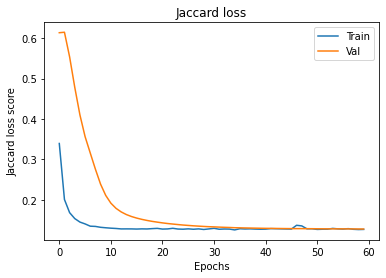

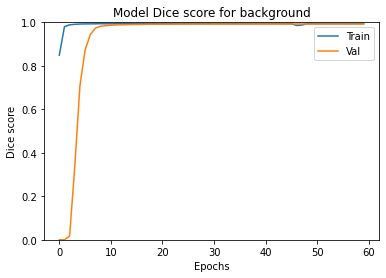

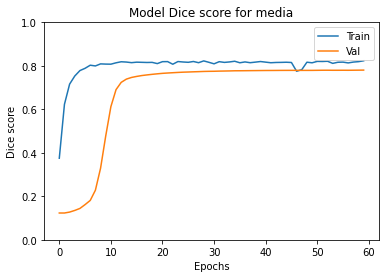

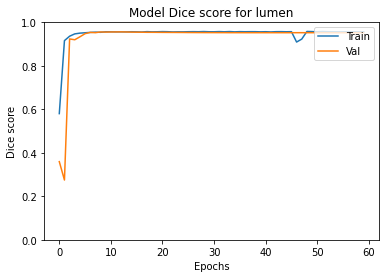

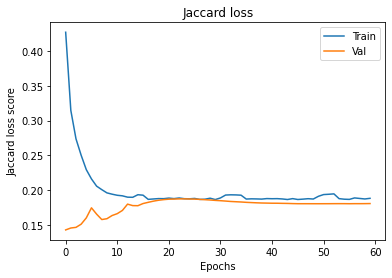

...

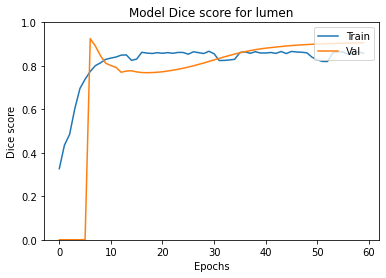

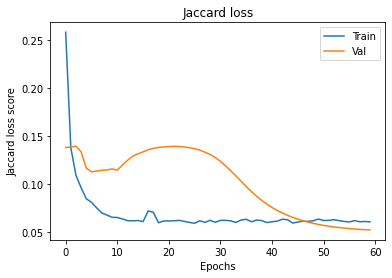

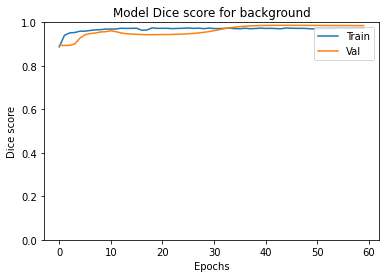

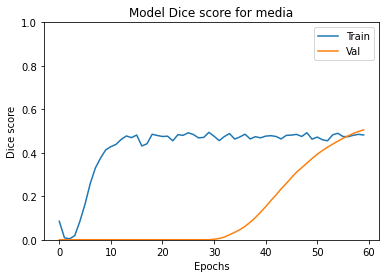

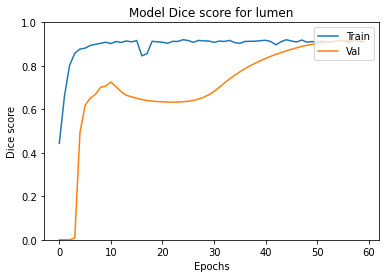

In [25]:
models = [vunet_model, resnet_model, deeplabv3_model]
for i in range(len(models)):
    # Free up RAM in case the model definition cells were run multiple times
    K.clear_session()
    
    model = models[i]

    steps_per_epoch = 2*np.ceil(len(images)*0.85/batch_size)
    # For each step: new_learning_rate = initial_learning_rate * decay_rate ^ (step / decay_steps)
    lr_schedule = keras.optimizers.schedules.ExponentialDecay(
        initial_learning_rate=1e-3,
        decay_steps=steps_per_epoch,
        decay_rate=0.7
    )
    optimizer = keras.optimizers.Adam(
        learning_rate=lr_schedule
    )
    loss = jaccard_coef_loss
    metrics = [dice_for_class(i) for i in range(num_classes)]
    model.compile(
        optimizer=optimizer,
        loss=loss,
        metrics=metrics,
    )

    callbacks = [
        keras.callbacks.ModelCheckpoint(f"ivus_segmentation_{model.name}.h5", save_best_only=True, verbose=1),
    ]
    
    # Train the model, doing validation at the end of each epoch.
    epochs = 60

    history = model.fit(
        gen_dtype(train_generator),
        validation_data=gen_dtype(val_generator),
        steps_per_epoch=steps_per_epoch,
        validation_steps = np.ceil(len(images)*0.15/batch_size),
        epochs=epochs,
        callbacks=callbacks,
        verbose=1
    )

    f1 = plt.figure(4*i+1)
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('Jaccard loss')
    plt.xlabel('Epochs')
    plt.ylabel('Jaccard loss score')
    plt.legend(['Train', 'Val'], loc='upper right')
    f1.show()

    f2 = plt.figure(4*i+2)
    plt.plot(history.history['dice_background'])
    plt.plot(history.history['val_dice_background'])
    plt.title('Model Dice score for background')
    plt.xlabel('Epochs')
    plt.ylabel('Dice score')
    plt.ylim([0, 1])
    plt.legend(['Train', 'Val'], loc='upper right')
    f2.show()

    f3 = plt.figure(4*i+3)
    plt.plot(history.history['dice_media'])
    plt.plot(history.history['val_dice_media'])
    plt.title('Model Dice score for media')
    plt.xlabel('Epochs')
    plt.ylabel('Dice score')
    plt.ylim([0, 1])
    plt.legend(['Train', 'Val'], loc='upper right')
    f3.show()

    f4 = plt.figure(4*i+4)
    plt.plot(history.history['dice_lumen'])
    plt.plot(history.history['val_dice_lumen'])
    plt.title('Model Dice score for lumen')
    plt.xlabel('Epochs')
    plt.ylabel('Dice score')
    plt.ylim([0, 1])
    plt.legend(['Train', 'Val'], loc='upper right')
    f4.show()


In [26]:
def get_mask_from_prediction(prediction):
    return np.rint(prediction)

def print_predictions(image, ground_truth, prediction, save_filename=None):
    plt.figure(figsize=(20,20))
    plt.subplot(1, 3, 1)
    plt.title("Original image")
    plt.axis('off')
    plt.imshow(image)
    
    plt.subplot(1, 3, 2)
    plt.title("Ground Truth")
    plt.axis('off')
    plt.imshow(ground_truth)
    
    plt.subplot(1, 3, 3)
    plt.title("Prediction")
    plt.axis('off')
    plt.imshow(prediction) 
    
    if save_filename:
        plt.savefig(os.path.join(os.getcwd(), "output", f"v{version}", "masks_prediction", save_filename))

def print_predictions_overlay(image, ground_truth, prediction, save_filename=None):
    plt.figure(figsize=(20,20))
    plt.subplot(1, 3, 1)
    plt.title("Original image")
    plt.axis('off')
    plt.imshow(image)
    
    handles = [
        mpatches.Patch(color='red', label='Ground Truth & Not Predicted'),
        mpatches.Patch(color='xkcd:green', label='Not Ground Truth & Predicted'),
        mpatches.Patch(color='blue', label='Ground Truth & Predicted')
    ]
    
    media_image = np.zeros(image.shape)
    media_image[:, :, 0][(ground_truth[:, :, 1]==1) & (prediction[:, :, 1]==0)] = 1
    media_image[:, :, 1][(ground_truth[:, :, 1]==0) & (prediction[:, :, 1]==1)] = 1
    media_image[:, :, 2][(ground_truth[:, :, 1]==1) & (prediction[:, :, 1]==1)] = 1
    plt.subplot(1, 3, 2)
    plt.title("Media mask")
    plt.axis('off')
    plt.legend(handles=handles)
    plt.imshow(media_image)
    
    lumen_image = np.zeros(image.shape)
    lumen_image[:, :, 0][(ground_truth[:, :, 2]==1) & (prediction[:, :, 2]==0)] = 1
    lumen_image[:, :, 1][(ground_truth[:, :, 2]==0) & (prediction[:, :, 2]==1)] = 1
    lumen_image[:, :, 2][(ground_truth[:, :, 2]==1) & (prediction[:, :, 2]==1)] = 1
    plt.subplot(1, 3, 3)
    plt.title("Lumen mask")
    plt.axis('off')
    plt.legend(handles=handles)
    plt.imshow(lumen_image)
    
    if save_filename:
        plt.savefig(os.path.join(os.getcwd(), "output", f"v{version}", "masks_overlay", save_filename))

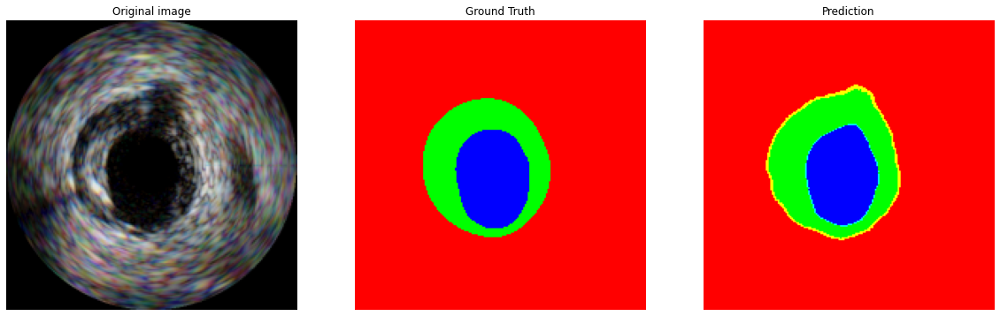

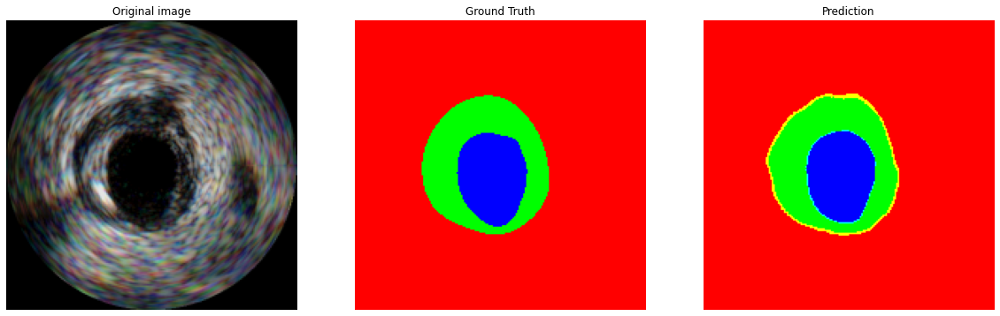

In [27]:
# Show some predictions from the training dataset
best_model = keras.models.load_model(
    'ivus_segmentation_VGG16_U-Net.h5',
    custom_objects={
        'jaccard_coef_loss': jaccard_coef_loss,
        'dice_background': dice_for_class(0),
        'dice_media': dice_for_class(1),
        'dice_lumen': dice_for_class(2),
    }
)
best_model.compile(
    optimizer=optimizer,
    loss=loss,
    metrics=metrics,
)

samples = 2


random_num = random.randint(0, len(images)-samples)

test_images = images[random_num:random_num+samples]
test_masks = masks[random_num:random_num+samples]
test_predictions = best_model.predict(test_images)

for i in range(samples):
    print_predictions(test_images[i], test_masks[i], get_mask_from_prediction(test_predictions[i]))

## Let's test our model

In [28]:
y_test_obs1 = get_one_hot(create_masks(x_test_ds, y_test_label_ds), num_classes)
#y_test_obs2_v1 = create_masks(x_test, y_test_label[1])
#y_test_obs2_v2 = create_masks(x_test, y_test_label[2])

In [29]:
images_test = x_test_ds[:, 2:5, :, :].transpose([0, 2, 3, 1])/255 # Now the shape is (num_images, 192, 192, 3) (for dataset B)
masks_test = y_test_obs1 # Now the shape is (num_images, 192, 192, channels) (for dataset B)

    
print(f"Shape of set images_test: {images_test.shape}")
print(f"Shape of set masks_test: {masks_test.shape}")

Shape of set images_test: (326, 192, 192, 3)
Shape of set masks_test: (326, 192, 192, 3)


In [30]:
score = best_model.evaluate(images_test, masks_test, verbose=1)
print("Test loss:", score[0])
print("Test metric:", score[1])

11/11 [==============================] - 17s 622ms/step - loss: 0.1411 - dice_background: 0.9869 - dice_media: 0.7275 - dice_lumen: 0.8875
Test loss: 0.14109691977500916
Test metric: 0.9868752956390381


/tmp/ipykernel_25945/3347976619.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


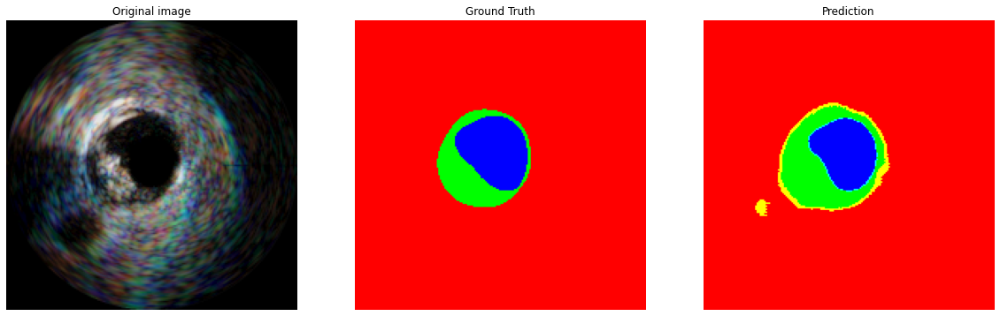

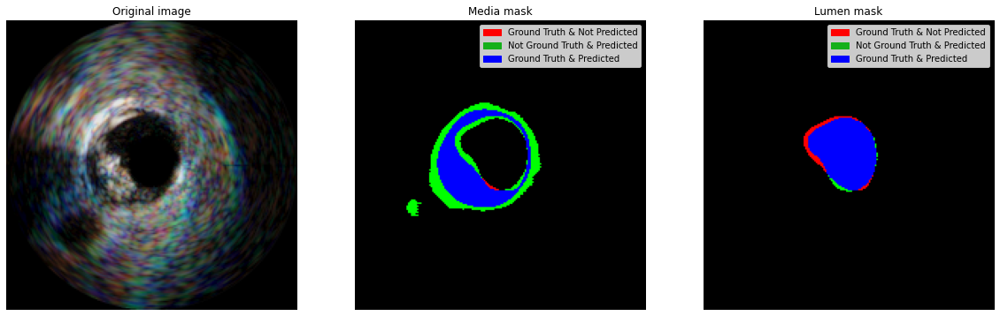

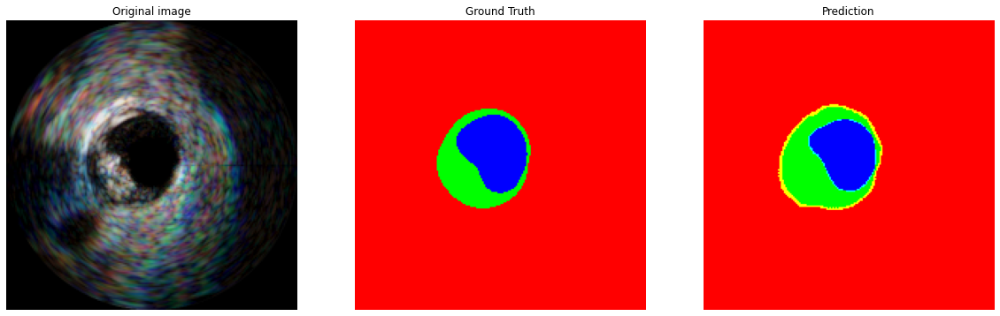

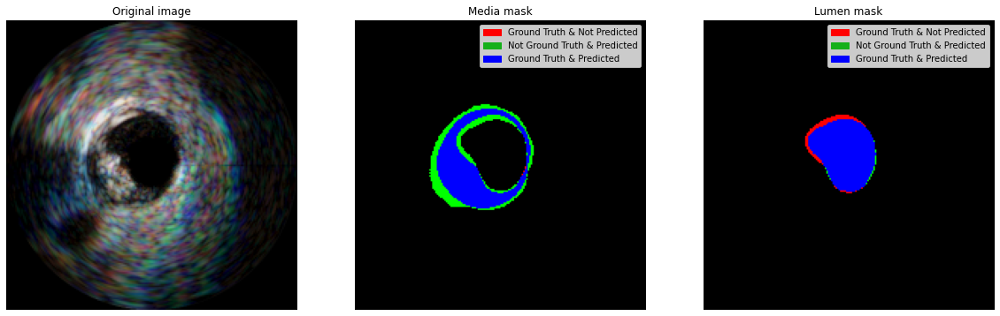

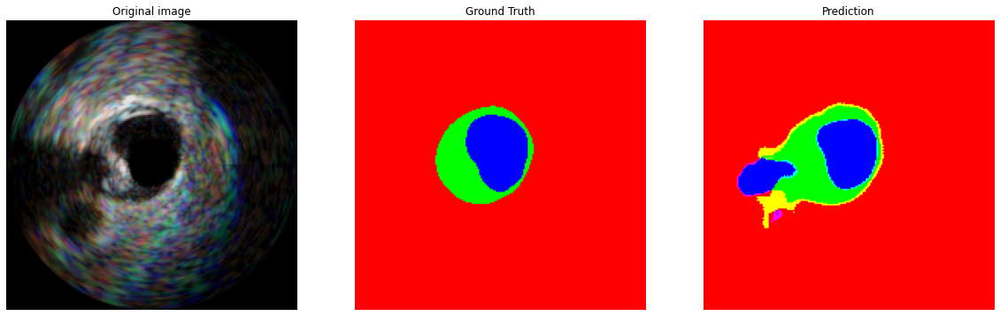

...

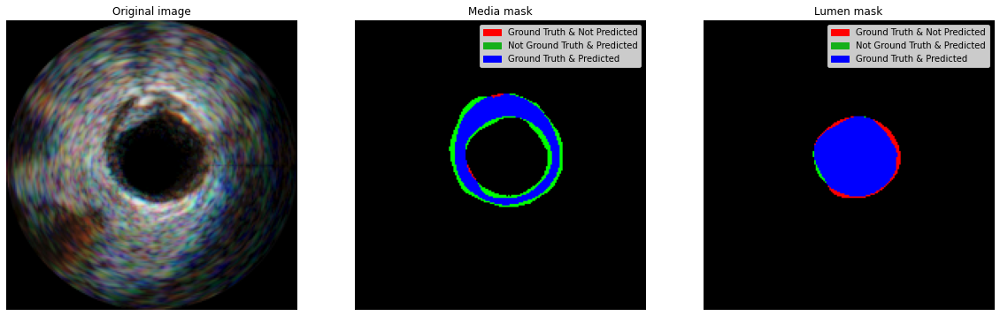

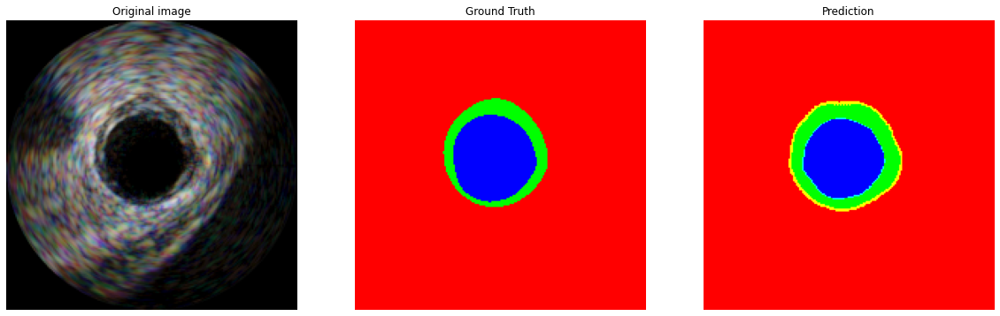

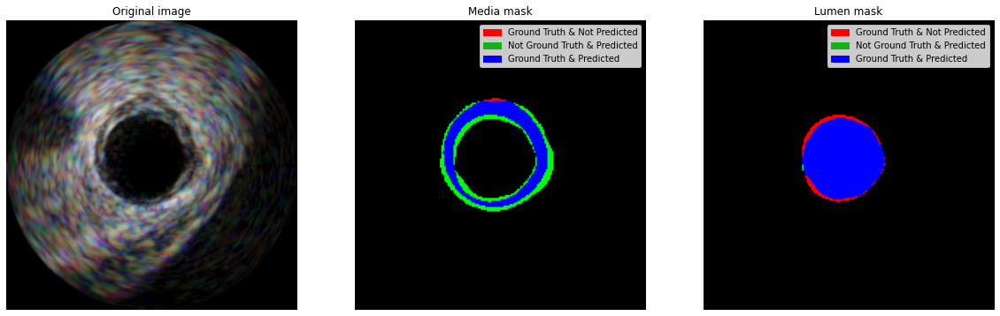

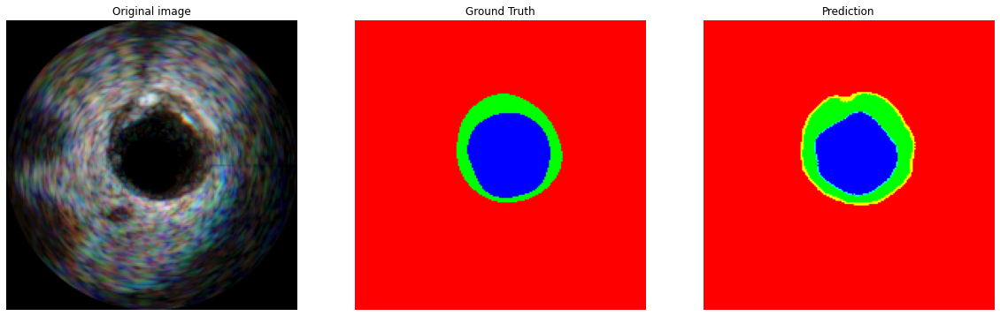

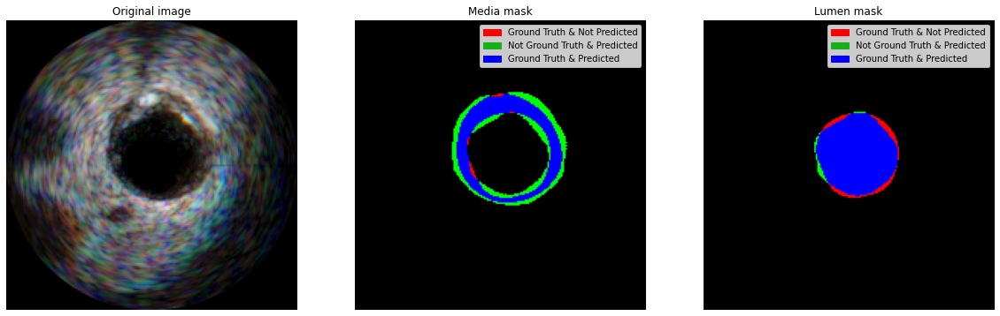

In [31]:
# Show some predictions from the test dataset
samples = 20

test_images = images_test[:samples]
test_masks = masks_test[:samples]
test_predictions = best_model.predict(test_images)

for i in range(samples):
    save_filename=f"frame_03_00{10+i:02}_003.png"
    print_predictions(
        test_images[i],
        test_masks[i],
        get_mask_from_prediction(test_predictions[i]),
        save_filename=save_filename
    )
    print_predictions_overlay(
        test_images[i],
        test_masks[i],
        get_mask_from_prediction(test_predictions[i]),
        save_filename=save_filename
    )

## Now let's plot some measures of our results
First, we will plot the confusion matrix to see which classes are overpredicted and which ones are underpredicted. We expect that the model overpredicts the background.

In [32]:
# Prediction of all test images
def get_class_mask_from_prediction(prediction):
    return np.argmax(prediction, axis=-1)
    
masks_test = get_class_mask_from_prediction(masks_test)
prediction_masks_test = np.array([get_class_mask_from_prediction(mask) for mask in best_model.predict(images_test)])

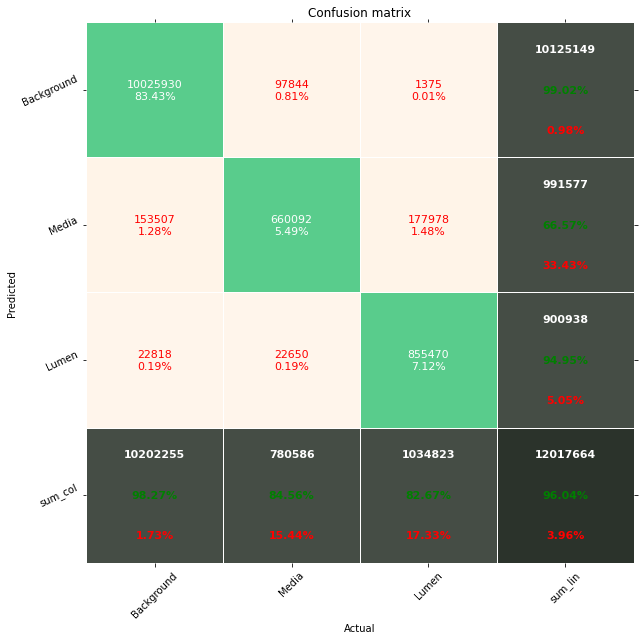

In [33]:
plot_confusion_matrix_from_data(
    masks_test.flatten(),
    prediction_masks_test.flatten(),
    columns=['Background', 'Media', 'Lumen']
)

### Main classification metrics
Now, we can report the main classification metrics. These are:
- Precision: $\frac{TP}{TP + FP}$, where $TP$ and $FP$ are the number of True Positives and False Positives respectively.
- Recall or sensitivity (True Positive Rate): $\frac{TP}{TP + FN}$, where $TP$ and $FN$ are the number of True Positives and False Negatives respectively.
- F1 score: the harmonic mean of precision and recall, therefore it gives more weight to the lower values. $\frac{2}{recall^{-1} + precision^{-1}} = \frac{TP}{TP + \frac{1}{2}(FP+FN)}$, where $FN$ is the number of False Negatives.
- Support: the number of pixels of each class $TP+FN$
- Specificity (True Negative Rate): $\frac{TN}{TN+FP}$

Finally, we will evaluate the generated masks with some measures useful when we want to compare the similarity of different sample sets:
- Jaccard index: consider two sets $A$ and $B$, the jaccard index is defined as $J(A,B) = \frac{|A \cap B|}{|A \cup B|} = \frac{|A \cap B|}{|A| + |B| - |A \cap B|}$, where $|·|$ is the cardinality.
- Hausdorff distance: we use it to measure how far away each set of points are. It is defined as $ d_{H}(X, Y) = max\{\sup_{x \in X}{d(x, Y)}, \sup_{y \in Y}{d(y, X)} \} $.

In [34]:
def get_specificity(col, cm):
    """Return the specificity of a variable in a 3x3 confusion matrix"""
    col_bef = (col-1)%3
    col_aft = (col+1)%3
    
    tp = cm[col,col]
    tn = cm[col_bef,col_bef] + cm[col_aft,col_aft]
    fp = cm[col_bef,col] + cm[col_aft,col]
    fn = cm[col,col_bef] + cm[col,col_aft]
    
    return float(tn)/float(tn+fp)

def custom_classification_report(y_true, y_pred, classes=['background', 'media', 'lumen']):
    
    # Obtain precision, recall, f1-score and support
    data = classification_report(
        y_true.flatten(),
        y_pred.flatten(),
        output_dict=True,
        target_names=classes
    )
    data.pop('macro avg')
    data.pop('weighted avg')
    data.pop('accuracy')
    
    # Get jaccard score
    jacc = jaccard_score(
        y_true.flatten(),
        y_pred.flatten(),
        average=None
    )
    
    # Compute average hausdorff distance
    hausdorff_dist_avg = np.zeros(len(classes))
    for i in range(len(y_true)):
        # Ground truth
        gt = y_true[i]
        # Predicted segmentation
        seg = y_pred[i]

        # Evaluate for each class
        for j in range(len(classes)):
            hausdorff_dist_avg[j] += hausdorff_distance(gt==j, seg==j)
    hd = hausdorff_dist_avg/len(y_true)
    
    # Finally compute specificity
    cm = confusion_matrix(y_true.flatten(), y_pred.flatten())
    for i in range(len(classes)):
        data[classes[i]]['specificity'] = get_specificity(i, cm)
        data[classes[i]]['jaccard_score'] = jacc[i]
        data[classes[i]]['avg_hausdorff_dist'] = hd[i]
    
    return pd.DataFrame(data)

In [35]:
# Display metrics in a table format

pd.options.display.float_format = '{:,.2f}'.format
df = custom_classification_report(masks_test, prediction_masks_test)
df.to_csv(os.path.join(os.getcwd(), "output", f"v{version}", "metrics.csv"))

print(df)

                      background      media        lumen
precision                   0.99       0.67         0.95
recall                      0.98       0.85         0.83
f1-score                    0.99       0.74         0.88
support            10,202,255.00 780,586.00 1,034,823.00
specificity                 0.94       0.97         1.00
jaccard_score               0.97       0.59         0.79
avg_hausdorff_dist         10.10      17.99        16.10
